# <a href="https://thetahat.ru/courses/ad">Введение в анализ данных</a>


## Применение различных нейросетевых моделей

<a href="https://thetahat.ru/courses/ad/main/4/nn_simple_examples" target="_blank">Ранее</a> мы рассмотрели базовые примеры работы с библиотекой PyTorch.
В этом ноутбуке представлены варианты решения различных практических задач с помощью нейронных сетей. Посмотрев этот ноутбук, вы не научитесь решать данные задачи. Главная цель &mdash; *познакомить вас с различными областями применения нейронных сетей и показать как интересен мир* :)

В этом ноутбуке рассматривается *только применение различных нейросетевых моделей*, обучение моделей не показано. Здесь используются уже кем-то обученные модели, для чего загружаются параметры моделей явным или неявным образом. **Если хотите узнать, как обучать подобные модели, приходите на факультативную часть курса, где будут темы по CV и NLP!** А полноценное погружение в мир CV и NLP ждет вас на 3 курсе, в частности, на DS-потоке будет по 7 лекций на каждую из них.

> Чтобы все корректно отработало, этот ноутбук нужно запускать в той среде, где есть **графический процессор** (GPU = Graphics processing unit) от Nvidia. Графические процессоры позволяют ускорять матричные вычисления, которые постоянно производятся во время обучения и применения нейронных сетей. Необходимость использования GPU исключительно от Nvidia заключается в том, что PyTorch производит операции на GPU благодаря библиотеке CUDA, которая написана также компанией Nvidia для своих графических процессоров.
>
> Примером среды, где вы можете бесплатно воспользоваться GPU, служит <a href="https://colab.research.google.com/?hl=ru" target="_blank">Google Colab</a>. Однако учтите, что на данный момент доступ к GPU ограничен работой в несколько часов в сутки. Для того, чтобы подключиться GPU, зайдите в меню `Среда выполнения`, выберите опцию `Cменить среду выполнения`. В списке аппаратных ускорителей выберите GPU.

In [ ]:
# !pip install -q 'git+https://github.com/facebookresearch/detectron2.git'

In [ ]:
import numpy as np
import requests

import cv2
import matplotlib.pyplot as plt
from PIL import Image

### 1. Определение объектов на изображении

Наша задача &mdash; для заранее заданных категорий объектов, таких как человек, сумка и другие, определить их расположение на изображении, если они там присутствуют. Кроме того, нам необходимо выделить области, соответствующие каждому объекту на картинке, и дать им название. В мире компьютерного зрения эта задача известна как **объектная сегментация**, или **instance segmentation**.

Для решения задачи объектной сегментации будем пользоваться библиотекой <a href="https://github.com/facebookresearch/detectron2" target="_blank">Detectron2</a>. Она удобна тем, что нужно приложить совсем немного усилий, чтобы решить поставленную задачу.

In [ ]:
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog

Отобразим изображение, с которым будем работать.



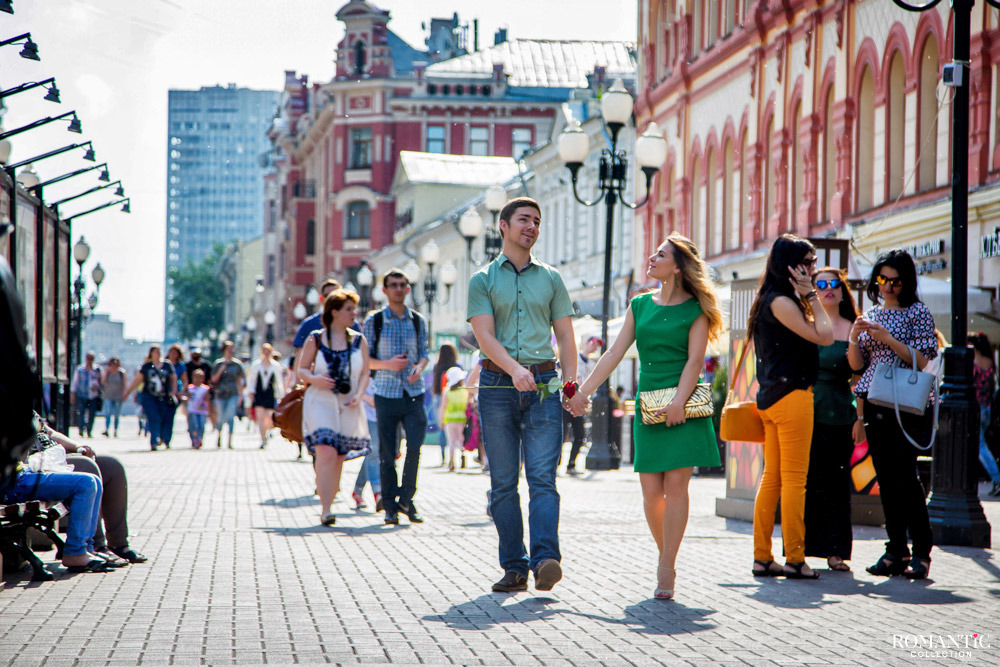

In [ ]:
# ссылка на изображение
url = "https://thetahat.ru/files/ad/main/4/segm_picture.jpeg"
# скачиваем изображение
response = requests.get(url, stream=True).raw

# переводим изображение в numpy-массив
input_image_np = np.asarray(bytearray(response.read()), dtype="uint8")

# переводим изображение в формат open-cv
input_image_cv2 = cv2.imdecode(input_image_np, cv2.IMREAD_COLOR)

# отображаем изображение с помощью PIL.Image
Image.fromarray(input_image_cv2[:, :, ::-1])

Пример работы с локальным изображением.

In [ ]:
# # Считываем изображение
# input_image_cv2 = cv2.imread("путь до изображения")

# # Отображаем изображение с помощью PIL.Image
# Image.fromarray(input_image_cv2[:, :, ::-1])

Соберем конфигурацию модели, т.е. определим параметры для инициализации модели. Среди параметров укажем
* какой класс моделей мы будем использовать,
* откуда следует загрузить параметры,
* а также настроим некоторый порог для предсказания.

Затем инициализируем модель.





In [ ]:
# Собираем конфигурацию
cfg = get_cfg()
cfg.merge_from_file(
    model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")
)
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url(
    "COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"
)
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5

# Инициализируем модель
predictor = DefaultPredictor(cfg)

Посмотрим, как выглядит модель. Она состоит из трех основных блоков:
* `backbone`,
* `proposal_generator`,
* `roi_heads`.

*Для чего они нужны, будет рассказано на 3 курсе.*

Каждый из этих блоков в свою очередь состоит еще из нескольких блоков, которые в итоге построены из модулей PyTorch. Мы даже можем найти уже известные нам модули в архитектуре модели, например,
* `Sequential` в `backbone.bottom_up.res2`,
* `Linear` и `ReLU` в `roi_heads.box_head`.

In [ ]:
predictor.model

GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res2): Sequential(
        (0): BottleneckBlock

Сделаем предсказание.

In [ ]:
outputs = predictor(input_image_cv2)

Посмотрим, что получилось.

Мы видим, что *модель достаточно точно определила области, соответствующие людям на изображении*. Практически все люди задетектированы моделью. Также модель нашла сумки, рюкзак и телефон.
Заметим, что *объекты одной категории модель отличает друг от друга* &mdash; на изображении они выделены разными цветами.

Также модель выдает уверенность в предсказании объекта. Интересно, что в предсказании людей модель больше всего уверена, особенно, если они находятся на переднем плане.

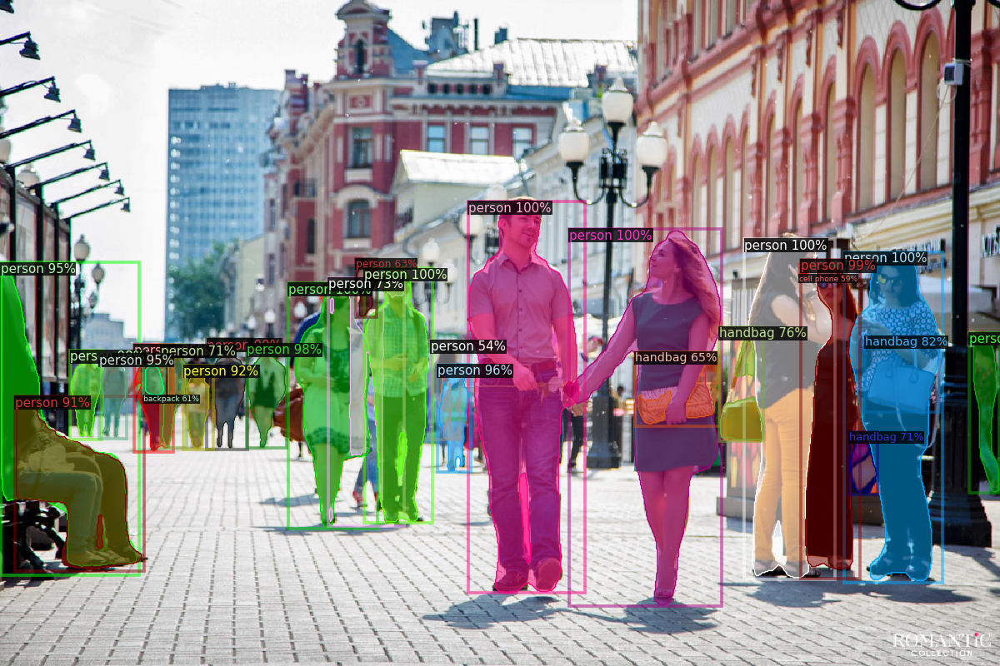

In [ ]:
visualizer = Visualizer(
    input_image_cv2[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2
)
visualizer = visualizer.draw_instance_predictions(outputs["instances"].to("cpu"))
Image.fromarray(visualizer.get_image())

Теперь решим слегка иную задачу. Она отличается от предыдущей тем, что кроме уже определенных категорий объектов, *требуется также определить фоновые области: небо, здания, тротуар и т.д*. В области компьютерного зрения эта задача имеет свое название &mdash; **паноптическая сегментация**, или **panoptic segmentation**.

Так же как и раньше зададим конфигурацию модели, решающей поставленную задачу и зададим саму модель. Среди параметров укажем какой класс моделей мы будем использовать, откуда следует загрузить параметры.

In [ ]:
# Собираем конфигурацию
cfg = get_cfg()
cfg.merge_from_file(
    model_zoo.get_config_file("COCO-PanopticSegmentation/panoptic_fpn_R_101_3x.yaml")
)
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url(
    "COCO-PanopticSegmentation/panoptic_fpn_R_101_3x.yaml"
)
predictor = DefaultPredictor(cfg)

Сделаем предсказание.

In [ ]:
outputs = predictor(input_image_cv2)

По сравнению с результатом применения предыдущей модели, мы теперь видим, что модель определила тротуар, здания, небо и деревья.

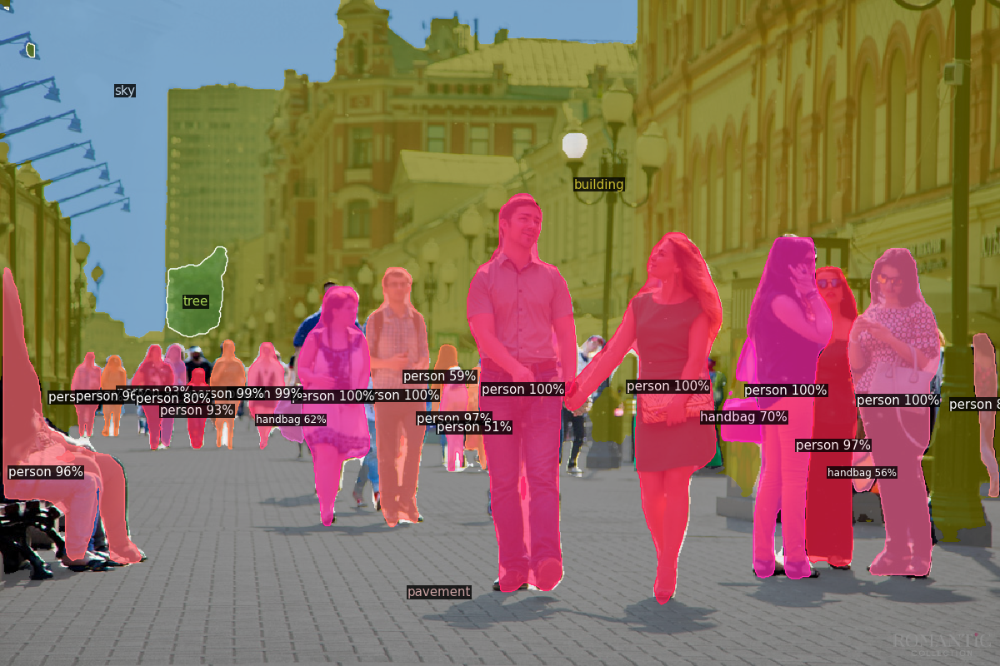

In [ ]:
visualizer = Visualizer(
    input_image_cv2[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2
)
panoptic_seg, segments_info = outputs["panoptic_seg"]
visualizer = visualizer.draw_panoptic_seg_predictions(panoptic_seg.to("cpu"), segments_info)
Image.fromarray(visualizer.get_image())

### 2. Детекция точек лица
Детекция точек лица заключается в том, чтобы найти на фотографии ключевые точки, которые обозначают разные части рта, носа, глаз и т.д. Это нужно, например, для того, чтобы переносить мимику актеров на персонажей фильма или игры. Для решения этой задачи мы будем использовать библиотеку <a href="https://github.com/1adrianb/face-alignment" target="_blank">face-alignment</a>.


In [ ]:
# !pip install -q face_alignment

In [ ]:
import face_alignment
import urllib

Скачаем изображение.

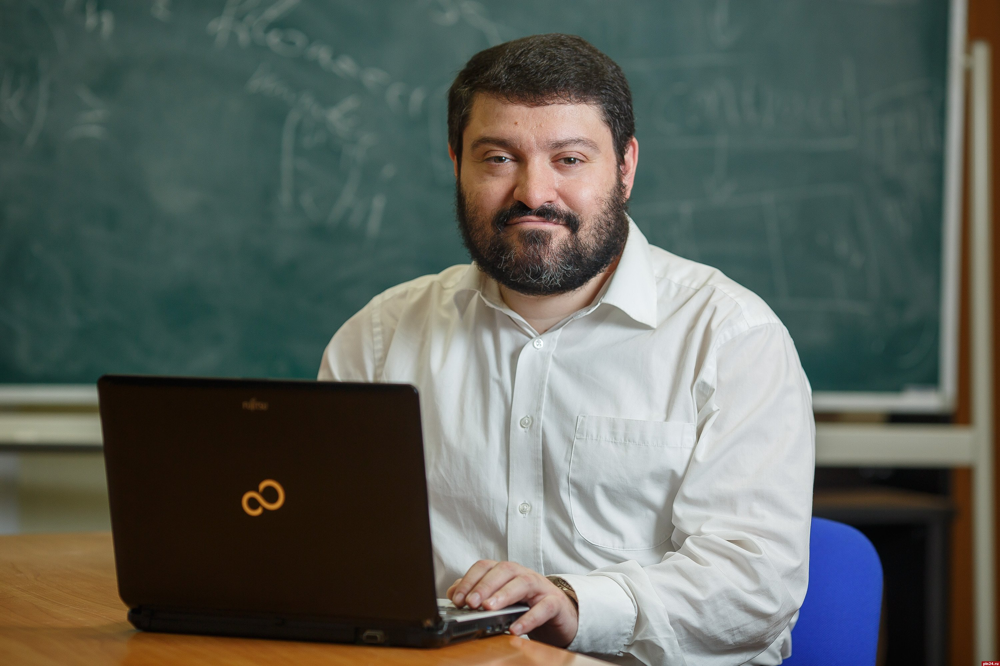

In [ ]:
# Скачиваем изображение
urllib.request.urlretrieve(
    "https://miptstats.github.io/courses/ad_fivt/img/raigor.jpeg", "face.jpg"
)

# Отображаем изображение
face_image = Image.open("face.jpg")
face_image

Применим модель.

In [ ]:
# Инициализируем модель
fa = face_alignment.FaceAlignment(face_alignment.LandmarksType._2D, flip_input=False)

# Делаем предсказания
preds = fa.get_landmarks(np.array(face_image))

В результате применения модели мы получили большой набор точек, который характеризует положение головы и мимику персоны. Можно заметить, что точки аккуратно находят границы век, бровей, носа, губ и даже нижнего контура лица, несмотря на наличие бороды.

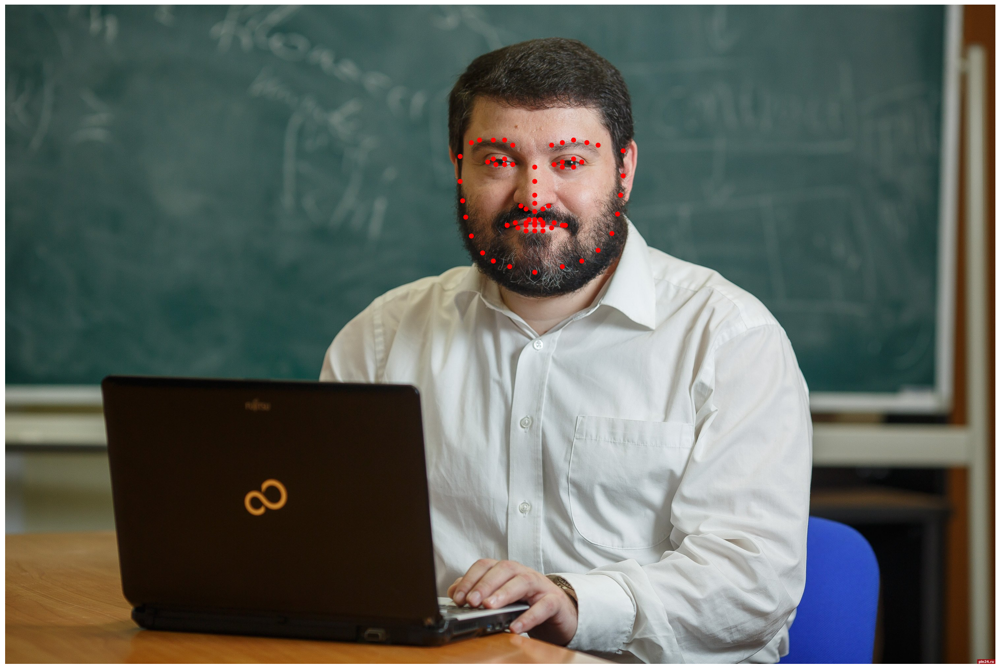

In [ ]:
plt.figure(figsize=(25, 25))
plt.axis("off")
plt.imshow(face_image)
for face_keypoints in preds:
    plt.scatter(face_keypoints[:, 0], face_keypoints[:, 1], color="red")

### 3. Генерация текста

Задача генерации текста заключается в том, чтобы по заданному фрагменту текста создать читаемый и соответствующий ему другой текст. В большинстве случаев именно так и формулируется задача, однако не всегда для генерации используется только текст. Иногда в качестве основы могут выступать изображения, числовые параметры и т.д., также возможна безусловная генерация.

Задача генерации текста особенно актуальна для диалоговых систем, где модель должна поддерживать разговор с человеком. Будем использовать самую популярную библиотеку для применения нейронных моделей к текстам &mdash; <a href="https://huggingface.co/docs/transformers/index" target="_blank">transformers</a>.

In [ ]:
from transformers import AutoModelForCausalLM, AutoTokenizer

Будем работать с недавно вышедшей <a href="https://huggingface.co/Vikhrmodels/QVikhr-2.5-1.5B-Instruct-SMPO" target="_blank">моделью от Vikhr models</a>, которая способна генерировать текст на русском языке.

In [ ]:
model_name = "Vikhrmodels/QVikhr-2.5-1.5B-Instruct-SMPO"
model = AutoModelForCausalLM.from_pretrained(
    model_name, torch_dtype=torch.float16, device_map="auto"
)
tokenizer = AutoTokenizer.from_pretrained(model_name)

config.json:   0%|          | 0.00/746 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/3.09G [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/242 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/7.34k [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/2.78M [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/1.67M [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/11.4M [00:00<?, ?B/s]

added_tokens.json:   0%|          | 0.00/605 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/613 [00:00<?, ?B/s]

Сымитируем диалог с моделью. Для этого будем каждый раз подавать в модель историю всего диалога, а она будет генерировать ответ. При этом специальным образом укажем, что мы работаем в режиме диалога — свои реплики будем помечать от имени `user`, а реплики модели от имени `assistant`.

Заметим, что результат диалога будет зависеть как от вводимого нами текста, так и от случайности.

In [ ]:
messages = [
    {
        "role": "system",
        "content": "Ты — Vikhr, ИИ помощник. Отвечай на вопросы пользователя коротко, но достоверно.",
    },
]

while True:
    # Получаем текст от пользователя
    user_input = input("user: ")
    if user_input.lower() in ["exit", "quit"]:
        print("Завершаю беседу.")
        break

    # Обновляем контекст
    messages.append({"role": "user", "content": user_input})

    # Превращаем текст в тензоры
    input_ids = tokenizer.apply_chat_template(
        messages, truncation=True, add_generation_prompt=False, return_tensors="pt"
    ).to(model.device)
    # Генерируем ответ
    output = model.generate(
        input_ids,
        max_length=1512,
        temperature=0.4,
    )

    # Превращаем результат генерации в текст
    generated_text = tokenizer.decode(output[0], skip_special_tokens=True)

    # Отделяем сгенерированный текст от контекста
    generated_text = generated_text.split("assistant\n")[-1]
    print(generated_text)

    # Обновляем контекст
    messages.append({"role": "assistant", "content": generated_text})

user: Привет!
Привет! Как я могу помочь вам сегодня?
user: Как дела?
Все хорошо, спасибо за вопрос! Если у вас есть какие-то конкретные вопросы или темы для обсуждения, пожалуйста, дайте мне знать, и я постараюсь предоставить вам необходимую информацию.
user: Расскажи шутку
Конечно, вот одна шутка на русском языке:

Знаете ли вы, почему компьютеры никогда не умирают? Потому что они всегда "в сети"!

Надеюсь, эта шутка вам понравилась!
user: Покажи какую-нибудь научную концепцию
Конечно, давайте рассмотрим одну из современных научных концепций – квантовые вычисления.

**Квантовые вычисления** – это область информатики, которая использует квантово-механические явления, такие как суперпозиция и запутанность, для обработки информации. В отличие от классических компьютеров, которые используют биты (0 или 1), квантовые компьютеры могут использовать квантовые биты, или кубиты, которые могут находиться в состоянии 0, 1, или их комбинации одновременно благодаря принципу суперпозиции.

### Основ

Ждем вас на следующих лекциях, где вы сможете подробнее узнать про построение данных типов моделей!